In [1]:
import tensorflow as tf
import pandas as pd
import numpy as np
from tensorflow.keras.models import load_model

In [2]:
data = pd.read_csv("D:\\CS114\\CS114.O21\\Competition IT001\\data-tbtl\\annonimized.csv")
data

,"concat('it001',`assignment_id`)","concat('it001',`problem_id`)","concat('it001', username)",is_final,status,pre_score,coefficient,"concat('it001',`language_id`)",created_at,updated_at,judgement
0,90ce27571176d87961b565d5ef4b3de33ede04ac,789454427dd4097a14749e3dde63346b7a8d3811,ed9eaeb6a707f50154024b24d7efcb874a9795dd,0,SCORE,0,100,it0012,10-09 08:02:04,10-09 08:06:58,"{""times"":[0,0,0,0,0,0,0,0,0,0],""mems"":[0,0,0,0..."
1,90ce27571176d87961b565d5ef4b3de33ede04ac,789454427dd4097a14749e3dde63346b7a8d3811,ed9eaeb6a707f50154024b24d7efcb874a9795dd,0,SCORE,0,100,it0012,10-09 08:04:41,10-09 08:04:51,"{""times"":[0,0,0,0,0,0,0,0,0,0],""mems"":[0,0,0,0..."
2,90ce27571176d87961b565d5ef4b3de33ede04ac,789454427dd4097a14749e3dde63346b7a8d3811,ed9eaeb6a707f50154024b24d7efcb874a9795dd,1,SCORE,10000,100,it0012,10-09 08:06:49,10-09 08:06:58,"{""times"":[0,0,0,0,0,0,0,0,0,0],""mems"":[0,0,0,0..."
3,90ce27571176d87961b565d5ef4b3de33ede04ac,bf96fbdc5f499538c3e2bfbec5779c8a14b0a9ff,ed9eaeb6a707f50154024b24d7efcb874a9795dd,1,SCORE,10000,100,it0012,10-09 08:47:52,10-09 08:48:01,"{""times"":[0,0,0,0,0,0,0,0,0,0],""mems"":[0,0,0,0..."
4,90ce27571176d87961b565d5ef4b3de33ede04ac,7a6e5ca470ff47c3b5048f240c4738de71010c78,ed9eaeb6a707f50154024b24d7efcb874a9795dd,1,SCORE,10000,100,it0012,10-09 09:19:35,10-09 09:19:45,"{""times"":[0,0,0,0,0,0,0,0,0,0],""mems"":[0,0,0,0..."
...,...,...,...,...,...,...,...,...,...,...,...
295193,613aea04c978f5e72fffc8bcff1f7b695a63f7b1,388516cbf597351226be1bdbe5ef30b9dcef570f,232cce96362898f08e9150ba244adaf2d6583ab2,1,SCORE,10000,100,it0012,01-15 16:03:43,01-15 16:03:53,"{""times"":[0,0,0,0,0,0,0,0,0,0,0,0,0,0],""mems"":..."
295194,613aea04c978f5e72fffc8bcff1f7b695a63f7b1,d2b96124ccb8e27b4b8dacdb935e729cb1ba546b,232cce96362898f08e9150ba244adaf2d6583ab2,0,Compilation Error,0,100,it0012,01-15 16:04:07,01-15 16:05:08,"{""times"":[],""mems"":[],""verdicts"":{""\n\nIn func..."
295195,613aea04c978f5e72fffc8bcff1f7b695a63f7b1,d2b96124ccb8e27b4b8dacdb935e729cb1ba546b,232cce96362898f08e9150ba244adaf2d6583ab2,1,SCORE,10000,100,it0012,01-15 16:04:58,01-15 16:05:08,"{""times"":[0,0,0,0,0,0,0,0,0,0,0,0,0,0],""mems"":..."
295196,613aea04c978f5e72fffc8bcff1f7b695a63f7b1,8c0f8dd4ff55e1609f733e043ac5e88b1dde6e7c,232cce96362898f08e9150ba244adaf2d6583ab2,1,SCORE,10000,100,it0012,01-15 16:05:13,01-15 16:05:22,"{""times"":[0,0,0,0,0,0,0,0,0,0,0,0,0],""mems"":[0..."


In [3]:
data.rename(columns={"concat('it001',`assignment_id`)":"assignment_id",
                     "concat('it001',`problem_id`)":"problem_id",
                     "concat('it001', username)":"username",
                     "concat('it001',`language_id`)":"language_id"}, inplace=True)
data

,assignment_id,problem_id,username,is_final,status,pre_score,coefficient,language_id,created_at,updated_at,judgement
0,90ce27571176d87961b565d5ef4b3de33ede04ac,789454427dd4097a14749e3dde63346b7a8d3811,ed9eaeb6a707f50154024b24d7efcb874a9795dd,0,SCORE,0,100,it0012,10-09 08:02:04,10-09 08:06:58,"{""times"":[0,0,0,0,0,0,0,0,0,0],""mems"":[0,0,0,0..."
1,90ce27571176d87961b565d5ef4b3de33ede04ac,789454427dd4097a14749e3dde63346b7a8d3811,ed9eaeb6a707f50154024b24d7efcb874a9795dd,0,SCORE,0,100,it0012,10-09 08:04:41,10-09 08:04:51,"{""times"":[0,0,0,0,0,0,0,0,0,0],""mems"":[0,0,0,0..."
2,90ce27571176d87961b565d5ef4b3de33ede04ac,789454427dd4097a14749e3dde63346b7a8d3811,ed9eaeb6a707f50154024b24d7efcb874a9795dd,1,SCORE,10000,100,it0012,10-09 08:06:49,10-09 08:06:58,"{""times"":[0,0,0,0,0,0,0,0,0,0],""mems"":[0,0,0,0..."
3,90ce27571176d87961b565d5ef4b3de33ede04ac,bf96fbdc5f499538c3e2bfbec5779c8a14b0a9ff,ed9eaeb6a707f50154024b24d7efcb874a9795dd,1,SCORE,10000,100,it0012,10-09 08:47:52,10-09 08:48:01,"{""times"":[0,0,0,0,0,0,0,0,0,0],""mems"":[0,0,0,0..."
4,90ce27571176d87961b565d5ef4b3de33ede04ac,7a6e5ca470ff47c3b5048f240c4738de71010c78,ed9eaeb6a707f50154024b24d7efcb874a9795dd,1,SCORE,10000,100,it0012,10-09 09:19:35,10-09 09:19:45,"{""times"":[0,0,0,0,0,0,0,0,0,0],""mems"":[0,0,0,0..."
...,...,...,...,...,...,...,...,...,...,...,...
295193,613aea04c978f5e72fffc8bcff1f7b695a63f7b1,388516cbf597351226be1bdbe5ef30b9dcef570f,232cce96362898f08e9150ba244adaf2d6583ab2,1,SCORE,10000,100,it0012,01-15 16:03:43,01-15 16:03:53,"{""times"":[0,0,0,0,0,0,0,0,0,0,0,0,0,0],""mems"":..."
295194,613aea04c978f5e72fffc8bcff1f7b695a63f7b1,d2b96124ccb8e27b4b8dacdb935e729cb1ba546b,232cce96362898f08e9150ba244adaf2d6583ab2,0,Compilation Error,0,100,it0012,01-15 16:04:07,01-15 16:05:08,"{""times"":[],""mems"":[],""verdicts"":{""\n\nIn func..."
295195,613aea04c978f5e72fffc8bcff1f7b695a63f7b1,d2b96124ccb8e27b4b8dacdb935e729cb1ba546b,232cce96362898f08e9150ba244adaf2d6583ab2,1,SCORE,10000,100,it0012,01-15 16:04:58,01-15 16:05:08,"{""times"":[0,0,0,0,0,0,0,0,0,0,0,0,0,0],""mems"":..."
295196,613aea04c978f5e72fffc8bcff1f7b695a63f7b1,8c0f8dd4ff55e1609f733e043ac5e88b1dde6e7c,232cce96362898f08e9150ba244adaf2d6583ab2,1,SCORE,10000,100,it0012,01-15 16:05:13,01-15 16:05:22,"{""times"":[0,0,0,0,0,0,0,0,0,0,0,0,0],""mems"":[0..."


In [4]:
data["ACCEPT"] = 0
data["WRONG"] = 0
data["Time Limit Exceeded"] = 0
data["Runtime Error"] = 0
data["Memory Limit Exceeded"] = 0
data["Killed"] = 0
data["Syntax"] = 0
data


,assignment_id,problem_id,username,is_final,status,pre_score,coefficient,language_id,created_at,updated_at,judgement,ACCEPT,WRONG,Time Limit Exceeded,Runtime Error,Memory Limit Exceeded,Killed,Syntax
0,90ce27571176d87961b565d5ef4b3de33ede04ac,789454427dd4097a14749e3dde63346b7a8d3811,ed9eaeb6a707f50154024b24d7efcb874a9795dd,0,SCORE,0,100,it0012,10-09 08:02:04,10-09 08:06:58,"{""times"":[0,0,0,0,0,0,0,0,0,0],""mems"":[0,0,0,0...",0,0,0,0,0,0,0
1,90ce27571176d87961b565d5ef4b3de33ede04ac,789454427dd4097a14749e3dde63346b7a8d3811,ed9eaeb6a707f50154024b24d7efcb874a9795dd,0,SCORE,0,100,it0012,10-09 08:04:41,10-09 08:04:51,"{""times"":[0,0,0,0,0,0,0,0,0,0],""mems"":[0,0,0,0...",0,0,0,0,0,0,0
2,90ce27571176d87961b565d5ef4b3de33ede04ac,789454427dd4097a14749e3dde63346b7a8d3811,ed9eaeb6a707f50154024b24d7efcb874a9795dd,1,SCORE,10000,100,it0012,10-09 08:06:49,10-09 08:06:58,"{""times"":[0,0,0,0,0,0,0,0,0,0],""mems"":[0,0,0,0...",0,0,0,0,0,0,0
3,90ce27571176d87961b565d5ef4b3de33ede04ac,bf96fbdc5f499538c3e2bfbec5779c8a14b0a9ff,ed9eaeb6a707f50154024b24d7efcb874a9795dd,1,SCORE,10000,100,it0012,10-09 08:47:52,10-09 08:48:01,"{""times"":[0,0,0,0,0,0,0,0,0,0],""mems"":[0,0,0,0...",0,0,0,0,0,0,0
4,90ce27571176d87961b565d5ef4b3de33ede04ac,7a6e5ca470ff47c3b5048f240c4738de71010c78,ed9eaeb6a707f50154024b24d7efcb874a9795dd,1,SCORE,10000,100,it0012,10-09 09:19:35,10-09 09:19:45,"{""times"":[0,0,0,0,0,0,0,0,0,0],""mems"":[0,0,0,0...",0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295193,613aea04c978f5e72fffc8bcff1f7b695a63f7b1,388516cbf597351226be1bdbe5ef30b9dcef570f,232cce96362898f08e9150ba244adaf2d6583ab2,1,SCORE,10000,100,it0012,01-15 16:03:43,01-15 16:03:53,"{""times"":[0,0,0,0,0,0,0,0,0,0,0,0,0,0],""mems"":...",0,0,0,0,0,0,0
295194,613aea04c978f5e72fffc8bcff1f7b695a63f7b1,d2b96124ccb8e27b4b8dacdb935e729cb1ba546b,232cce96362898f08e9150ba244adaf2d6583ab2,0,Compilation Error,0,100,it0012,01-15 16:04:07,01-15 16:05:08,"{""times"":[],""mems"":[],""verdicts"":{""\n\nIn func...",0,0,0,0,0,0,0
295195,613aea04c978f5e72fffc8bcff1f7b695a63f7b1,d2b96124ccb8e27b4b8dacdb935e729cb1ba546b,232cce96362898f08e9150ba244adaf2d6583ab2,1,SCORE,10000,100,it0012,01-15 16:04:58,01-15 16:05:08,"{""times"":[0,0,0,0,0,0,0,0,0,0,0,0,0,0],""mems"":...",0,0,0,0,0,0,0
295196,613aea04c978f5e72fffc8bcff1f7b695a63f7b1,8c0f8dd4ff55e1609f733e043ac5e88b1dde6e7c,232cce96362898f08e9150ba244adaf2d6583ab2,1,SCORE,10000,100,it0012,01-15 16:05:13,01-15 16:05:22,"{""times"":[0,0,0,0,0,0,0,0,0,0,0,0,0],""mems"":[0...",0,0,0,0,0,0,0


### Label Encoder

In [5]:
def get_unique_value_count():
    unique_values_count_all_columns = data.nunique()
    print("Số giá trị khác nhau trong mỗi cột của DataFrame:")
    print(unique_values_count_all_columns)
get_unique_value_count()

Số giá trị khác nhau trong mỗi cột của DataFrame:
assignment_id               203
problem_id                  469
username                   1489
is_final                      2
status                        4
pre_score                   631
coefficient                   4
language_id                   6
created_at               284530
updated_at               242976
judgement                 58406
ACCEPT                        1
WRONG                         1
Time Limit Exceeded           1
Runtime Error                 1
Memory Limit Exceeded         1
Killed                        1
Syntax                        1
dtype: int64


In [6]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
data["status"] = label_encoder.fit_transform(data["status"])
data["assignment_id"] = label_encoder.fit_transform(data["assignment_id"])
data["problem_id"] = label_encoder.fit_transform(data["problem_id"])
data["language_id"] = label_encoder.fit_transform(data["language_id"])

# Sửa đổi trực tiếp cột 'judgment' dựa trên điều kiện
# for index, row in data.iterrows():
#     value = row['judgement']
#     # ACCEPT
#     if '"verdicts":[]' in row['judgement']:
#         data.at[index, 'judgement'] = 0

#     # 2 LOẠI LỖI
#     if "Time Limit Exceeded" in value and "Runtime Error" in value:
#         data.at[index, 'judgement'] = 1
#     elif "Time Limit Exceeded" in value and "WRONG" in value:
#         data.at[index, 'judgement'] = 2
#     elif "Runtime Error" in value and "WRONG" in value:
#         data.at[index, 'judgement'] = 3
#     elif "Time Limit Exceeded" in value and "Memory Limit Exceeded" in value:
#         data.at[index, 'judgement'] = 4
#     elif "Runtime Error" in value and "Memory Limit Exceeded" in value:
#         data.at[index, 'judgement'] = 5
#     elif "WRONG" in value and "Memory Limit Exceeded" in value:
#         data.at[index, 'judgement'] = 6

#     # 3 LOẠI LỖI 
#     elif "Time Limit Exceeded" in value and "Runtime Error" in value and "WRONG" in value:
#         data.at[index, 'judgement'] = 7
#     elif "Time Limit Exceeded" in value and "Runtime Error" in value and "Memory Limit Exceeded" in value:
#         data.at[index, 'judgement'] = 8
#     elif "Time Limit Exceeded" in value and "WRONG" in value and "Memory Limit Exceeded" in value:
#         data.at[index, 'judgement'] = 9
#     elif "Runtime Error" in value and "WRONG" in value and "Memory Limit Exceeded" in value:
#         data.at[index, 'judgement'] = 10

#     # 4 LOẠI LỖI
#     elif "Time Limit Exceeded" in value and "Runtime Error" in value and "WRONG" in value and "Memory Limit Exceeded" in value:
#         data.at[index, 'judgement'] = 11

#     # 1 LOẠI LỖI
#     elif "Time Limit Exceeded" in value and "Runtime Error"  not in value and "WRONG" not in value and "Memory Limit Exceeded" not in value:
#         data.at[index, 'judgement'] = 12
#     elif "Time Limit Exceeded" not in value and "Runtime Error" in value and "WRONG" not in value and "Memory Limit Exceeded" not in value:
#         data.at[index, 'judgement'] = 13
#     elif "Time Limit Exceeded" not in value and "Runtime Error" not in value and "WRONG" in value and "Memory Limit Exceeded" not in value:
#         data.at[index, 'judgement'] = 14
#     elif "Time Limit Exceeded" not in value and "Runtime Error" not in value and "WRONG" not in value and "Memory Limit Exceeded" in value:
#         data.at[index, 'judgement'] = 15

#     elif '"times":[],"mems":[]' in row['judgement']:
#         data.at[index, 'judgement'] = 16
#     elif 'Killed' in row['judgement']:
#         data.at[index, 'judgement'] = 17
    
# for index, row in data.iterrows():
#     value = row['judgement']

#     if '"verdicts":[]' in row['judgement']:
#         data.at[index, 'ACCEPT'] = 1

#     if "Time Limit Exceeded" in value:
#         data.at[index, 'Time Limit Exceeded'] = 1

#     if "Runtime Error" in value:
#         data.at[index, 'Runtime Error'] = 1

#     if "WRONG" in value:
#         data.at[index, 'WRONG'] = 1

#     elif '"times":[],"mems":[]' in row['judgement']:
#         data.at[index, 'Syntax'] = 1
#     elif 'Killed' in row['judgement']:
#         data.at[index, 'Killed'] = 1
    
# data = data.drop("created_at",axis = 1)
# data = data.drop("updated_at",axis = 1)
# data = data.drop("judgement", axis = 1)


for index, row in data.iterrows():
    value = row['judgement']

    if '"verdicts":[]' in row['judgement']:
        data.at[index, 'ACCEPT'] = 1

    if "Time Limit Exceeded" in value:
        data.at[index, 'Time Limit Exceeded'] = 1

    if "Runtime Error" in value:
        data.at[index, 'Runtime Error'] = 1
    
    if "Memory Limit Exceeded" in value:
        data.at[index, 'Memory Limit Exceeded'] = 1

    if "WRONG" in value:
        data.at[index, 'WRONG'] = 1

    elif '"times":[],"mems":[]' in row['judgement']:
        data.at[index, 'Syntax'] = 1
        
    elif 'Killed' in row['judgement']:
        data.at[index, 'Killed'] = 1
    
data = data.drop("created_at",axis = 1)
data = data.drop("updated_at",axis = 1)
data = data.drop("judgement", axis = 1)

data

,assignment_id,problem_id,username,is_final,status,pre_score,coefficient,language_id,ACCEPT,WRONG,Time Limit Exceeded,Runtime Error,Memory Limit Exceeded,Killed,Syntax
0,116,208,ed9eaeb6a707f50154024b24d7efcb874a9795dd,0,1,0,100,1,0,1,0,0,0,0,0
1,116,208,ed9eaeb6a707f50154024b24d7efcb874a9795dd,0,1,0,100,1,0,1,0,0,0,0,0
2,116,208,ed9eaeb6a707f50154024b24d7efcb874a9795dd,1,1,10000,100,1,1,0,0,0,0,0,0
3,116,335,ed9eaeb6a707f50154024b24d7efcb874a9795dd,1,1,10000,100,1,1,0,0,0,0,0,0
4,116,212,ed9eaeb6a707f50154024b24d7efcb874a9795dd,1,1,10000,100,1,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295193,76,97,232cce96362898f08e9150ba244adaf2d6583ab2,1,1,10000,100,1,1,0,0,0,0,0,0
295194,76,378,232cce96362898f08e9150ba244adaf2d6583ab2,0,0,0,100,1,0,0,0,0,0,0,1
295195,76,378,232cce96362898f08e9150ba244adaf2d6583ab2,1,1,10000,100,1,1,0,0,0,0,0,0
295196,76,242,232cce96362898f08e9150ba244adaf2d6583ab2,1,1,10000,100,1,1,0,0,0,0,0,0


In [7]:
get_unique_value_count()

Số giá trị khác nhau trong mỗi cột của DataFrame:
assignment_id             203
problem_id                469
username                 1489
is_final                    2
status                      4
pre_score                 631
coefficient                 4
language_id                 6
ACCEPT                      2
WRONG                       2
Time Limit Exceeded         2
Runtime Error               2
Memory Limit Exceeded       2
Killed                      2
Syntax                      2
dtype: int64


In [8]:
#data.to_csv("test_it001.csv",index = True)

In [9]:
import pandas as pd
# Đường dẫn đến tệp .ods
file_path = "D:\\CS114\\CS114.O21\\Competition IT001\\public_it001\\ck-public.csv"

data_diem_qt = pd.read_csv(file_path)

# In ra DataFrame
data_diem_qt


,hash,CK
0,00b6dd4fc7eb817e03708c532016ef30ce564a61,5.5
1,00bef8afee8f3c595d535c9c03c490cac1a4f021,6.5
2,01122b3ef7e59b84189e65985305f575d6bdf83c,4.5
3,013de369c439ab0ead8aa7da64423aa395a8be39,5.0
4,014c59c6433fd764a0b08de6ffeb757eaf60aa73,4.0
...,...,...
756,840d07858c03f80f4695056e2cc7d0c474b83a25,5.5
757,844f5db2e7e31ae51eba025480679ed7e4708ac6,6.0
758,845acd04a77b3d1b623f255d9f9f8eae90892dab,6.0
759,8460eaaf887a6289fb156f7562fb739ba8e9629e,7.0


In [10]:
data_diem_qt["CK"]

0      5.5
1      6.5
2      4.5
3      5.0
4      4.0
      ... 
756    5.5
757    6.0
758    6.0
759    7.0
760    2.5
Name: CK, Length: 761, dtype: float64

In [11]:
data_diem_qt = data_diem_qt.dropna(subset=["CK"])
data_diem_qt["CK"].isnull().sum()

0

In [12]:
diem_qt_map = data_diem_qt.set_index('hash')['CK'].to_dict()

In [13]:
diem_qt_map

{'00b6dd4fc7eb817e03708c532016ef30ce564a61': 5.5,
 '00bef8afee8f3c595d535c9c03c490cac1a4f021': 6.5,
 '01122b3ef7e59b84189e65985305f575d6bdf83c': 4.5,
 '013de369c439ab0ead8aa7da64423aa395a8be39': 5.0,
 '014c59c6433fd764a0b08de6ffeb757eaf60aa73': 4.0,
 '0155f91fe242fe55e1af631b0f0afbe9938b185c': 4.0,
 '016f87a7bd87f233a8633fba8a1ca7ef5c3c63c1': 6.5,
 '017ec1bbad0d598e5a86ac3bd595b870b6456e61': 4.0,
 '01ad03ec301749c033155fc17e657cc767d447c8': 5.5,
 '020ef1c31cb4751bbfa1a88fba782db3c402e2fa': 5.0,
 '020f253c343856ea875e959023e79fb1d4d9c0a3': 8.0,
 '0248e16d134e1bd5b4352701e1f23b904b7c4cdf': 7.0,
 '024af5e4f76c23e7f08616c60e595453e538a1ba': 8.0,
 '0297fd76b36e100882756e636bb03031255f57da': 6.0,
 '02c88d535d7393d30ce3338174d0a17ee7e8b8cc': 3.5,
 '02f8a629f1a01a476de3944da2860d1c107f1b28': 4.5,
 '0304aa9c12a1c900dcb4413c6a4ce40cc05b1696': 9.0,
 '0306a80129ed6d5afadece8164929697bbbdea69': 6.5,
 '0341249377940c004d0823408ace7cddbddbc923': 7.5,
 '0367f82909c46a900501cc32d02b913923f75314': 9.0,


In [14]:
data['diem'] = None
data

,assignment_id,problem_id,username,is_final,status,pre_score,coefficient,language_id,ACCEPT,WRONG,Time Limit Exceeded,Runtime Error,Memory Limit Exceeded,Killed,Syntax,diem
0,116,208,ed9eaeb6a707f50154024b24d7efcb874a9795dd,0,1,0,100,1,0,1,0,0,0,0,0,None
1,116,208,ed9eaeb6a707f50154024b24d7efcb874a9795dd,0,1,0,100,1,0,1,0,0,0,0,0,None
2,116,208,ed9eaeb6a707f50154024b24d7efcb874a9795dd,1,1,10000,100,1,1,0,0,0,0,0,0,None
3,116,335,ed9eaeb6a707f50154024b24d7efcb874a9795dd,1,1,10000,100,1,1,0,0,0,0,0,0,None
4,116,212,ed9eaeb6a707f50154024b24d7efcb874a9795dd,1,1,10000,100,1,1,0,0,0,0,0,0,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295193,76,97,232cce96362898f08e9150ba244adaf2d6583ab2,1,1,10000,100,1,1,0,0,0,0,0,0,None
295194,76,378,232cce96362898f08e9150ba244adaf2d6583ab2,0,0,0,100,1,0,0,0,0,0,0,1,None
295195,76,378,232cce96362898f08e9150ba244adaf2d6583ab2,1,1,10000,100,1,1,0,0,0,0,0,0,None
295196,76,242,232cce96362898f08e9150ba244adaf2d6583ab2,1,1,10000,100,1,1,0,0,0,0,0,0,None


In [15]:
for index, row in data.iterrows():
    value = row['username']
    print(value)
    if value in diem_qt_map:
        data.at[index, 'diem'] = diem_qt_map[value]
# data = data.dropna(subset=['diem'])
data

ed9eaeb6a707f50154024b24d7efcb874a9795dd
ed9eaeb6a707f50154024b24d7efcb874a9795dd
ed9eaeb6a707f50154024b24d7efcb874a9795dd
ed9eaeb6a707f50154024b24d7efcb874a9795dd
ed9eaeb6a707f50154024b24d7efcb874a9795dd
ed9eaeb6a707f50154024b24d7efcb874a9795dd
ed9eaeb6a707f50154024b24d7efcb874a9795dd
ed9eaeb6a707f50154024b24d7efcb874a9795dd
ed9eaeb6a707f50154024b24d7efcb874a9795dd
ed9eaeb6a707f50154024b24d7efcb874a9795dd
ed9eaeb6a707f50154024b24d7efcb874a9795dd
ed9eaeb6a707f50154024b24d7efcb874a9795dd
ed9eaeb6a707f50154024b24d7efcb874a9795dd
ed9eaeb6a707f50154024b24d7efcb874a9795dd
ed9eaeb6a707f50154024b24d7efcb874a9795dd
ed9eaeb6a707f50154024b24d7efcb874a9795dd
ed9eaeb6a707f50154024b24d7efcb874a9795dd
ed9eaeb6a707f50154024b24d7efcb874a9795dd
ed9eaeb6a707f50154024b24d7efcb874a9795dd
ed9eaeb6a707f50154024b24d7efcb874a9795dd
ed9eaeb6a707f50154024b24d7efcb874a9795dd
ed9eaeb6a707f50154024b24d7efcb874a9795dd
ed9eaeb6a707f50154024b24d7efcb874a9795dd
ed9eaeb6a707f50154024b24d7efcb874a9795dd
ed9eaeb6a707f501

,assignment_id,problem_id,username,is_final,status,pre_score,coefficient,language_id,ACCEPT,WRONG,Time Limit Exceeded,Runtime Error,Memory Limit Exceeded,Killed,Syntax,diem
0,116,208,ed9eaeb6a707f50154024b24d7efcb874a9795dd,0,1,0,100,1,0,1,0,0,0,0,0,None
1,116,208,ed9eaeb6a707f50154024b24d7efcb874a9795dd,0,1,0,100,1,0,1,0,0,0,0,0,None
2,116,208,ed9eaeb6a707f50154024b24d7efcb874a9795dd,1,1,10000,100,1,1,0,0,0,0,0,0,None
3,116,335,ed9eaeb6a707f50154024b24d7efcb874a9795dd,1,1,10000,100,1,1,0,0,0,0,0,0,None
4,116,212,ed9eaeb6a707f50154024b24d7efcb874a9795dd,1,1,10000,100,1,1,0,0,0,0,0,0,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295193,76,97,232cce96362898f08e9150ba244adaf2d6583ab2,1,1,10000,100,1,1,0,0,0,0,0,0,6.0
295194,76,378,232cce96362898f08e9150ba244adaf2d6583ab2,0,0,0,100,1,0,0,0,0,0,0,1,6.0
295195,76,378,232cce96362898f08e9150ba244adaf2d6583ab2,1,1,10000,100,1,1,0,0,0,0,0,0,6.0
295196,76,242,232cce96362898f08e9150ba244adaf2d6583ab2,1,1,10000,100,1,1,0,0,0,0,0,0,6.0


In [16]:
diem_qt_map["0bd2037bf68a97753e5e67ab55dac026a649f279"]

1.0

In [17]:
data["diem"].isnull().sum()

138225

In [18]:
# data = data.drop(["username"], axis=1)
# data

In [19]:
import numpy as np
import pandas as pd

# Giả sử 'data' là DataFrame ban đầu

# Tách DataFrame thành hai DataFrame dựa trên giá trị của cột 'diem'
data_frame_test = data[data['diem'].isnull()]
data_frame_train = data[data['diem'].notnull()]

# Loại bỏ cột 'username' từ data_frame_train
data_frame_train = data_frame_train.drop("username", axis=1)

# Hàm làm sạch dữ liệu
def clean_data(df):
    # Loại bỏ các khoảng trắng ở đầu và cuối
    df = df.applymap(lambda x: str(x).strip() if isinstance(x, str) else x)
    # Thay thế các ký tự không hợp lệ
    df = df.replace('\xa0', '', regex=True)
    # Chuyển đổi các giá trị có thể thành số
    df = df.apply(pd.to_numeric, errors='coerce')
    return df

# Làm sạch dữ liệu
data_frame_train = clean_data(data_frame_train)

# Loại bỏ các hàng có giá trị không thể chuyển đổi
data_frame_train = data_frame_train.dropna()

# Chuyển đổi DataFrame thành NumPy arrays
data_train = data_frame_train.to_numpy()
X_train = data_train[:, :-1].astype(float)
y_train = data_train[:, -1].astype(float)

# Loại bỏ cột 'username' từ data_frame_test và gán giá trị 0 cho cột 'diem'
username_test = np.array(data_frame_test["username"])
test_array = data_frame_test.drop("username", axis=1)
test_array["diem"] = 0

# Làm sạch dữ liệu
test_array = clean_data(test_array)

# Điền các giá trị thiếu bằng 0 (hoặc một giá trị thích hợp khác)
test_array = test_array.fillna(0)

# Chuyển đổi test_array thành NumPy array
X_test = test_array.to_numpy()[:, :-1].astype(float)

print(X_train.shape)
print(y_train.shape)
print(type(X_train))
print(type(y_train))


C:\Users\vuong\AppData\Local\Temp\ipykernel_6124\3222347075.py:16: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df = df.applymap(lambda x: str(x).strip() if isinstance(x, str) else x)
C:\Users\vuong\AppData\Local\Temp\ipykernel_6124\3222347075.py:16: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df = df.applymap(lambda x: str(x).strip() if isinstance(x, str) else x)


(156973, 14)
(156973,)
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>


In [20]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.fit_transform(X_test)

print(X_train)
print(X_test)


[[ 0.21424141 -0.23435549 -0.68518752 ... -0.02878983 -0.0071391
   1.96330966]
 [ 0.21424141 -0.23435549 -0.68518752 ... -0.02878983 -0.0071391
   1.96330966]
 [ 0.21424141 -0.23435549 -0.68518752 ... -0.02878983 -0.0071391
   1.96330966]
 ...
 [-0.48674419  1.00648113  1.45945448 ... -0.02878983 -0.0071391
  -0.509344  ]
 [-0.48674419  0.01381183  1.45945448 ... -0.02878983 -0.0071391
  -0.509344  ]
 [-0.48674419  1.17435903  1.45945448 ... -0.02878983 -0.0071391
  -0.509344  ]]
[[ 0.2099065  -0.2356574  -0.70203681 ... -0.02873018 -0.00465878
  -0.49668569]
 [ 0.2099065  -0.2356574  -0.70203681 ... -0.02873018 -0.00465878
  -0.49668569]
 [ 0.2099065  -0.2356574   1.42442674 ... -0.02873018 -0.00465878
  -0.49668569]
 ...
 [-1.57190081 -0.13368677 -0.70203681 ... -0.02873018 -0.00465878
  -0.49668569]
 [-1.57190081  1.38858896  1.42442674 ... -0.02873018 -0.00465878
  -0.49668569]
 [-1.57190081 -0.13368677  1.42442674 ... -0.02873018 -0.00465878
  -0.49668569]]


In [21]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Dropout
def define_model():
    model = Sequential()
    
    # Lớp Dense đầu tiên với 256 nơ-ron và hàm kích hoạt 'relu'
    model.add(Dense(64, activation='relu', input_dim=14))
    
    # Lớp Dense thứ hai với 256 nơ-ron và hàm kích hoạt 'relu'
    model.add(Dense(128, activation='relu'))
    
    # Lớp Dense thứ ba với 512 nơ-ron và hàm kích hoạt 'relu'
    model.add(Dense(128, activation='relu'))
    
    model.add(Dense(256, activation='relu'))
    
    # Lớp Dense thứ tư với 512 nơ-ron và hàm kích hoạt 'relu'
    model.add(Dense(256, activation='relu'))
    # Lớp Dense thứ năm với 1024 nơ-ron và hàm kích hoạt 'relu'
    model.add(Dropout(0.5))
    
    # Lớp đầu ra với 1 nơ-ron và hàm kích hoạt 'relu'
    model.add(Dense(1, activation='relu'))
    
    # Biên dịch mô hình
    model.compile(optimizer='adamax', loss='mean_squared_error')
    
    return model


In [22]:
import matplotlib.pyplot as plt
def train_model():
    model = define_model()
    history = model.fit(X_train, y_train, epochs=100, batch_size=256, validation_split=0.2, shuffle = True, verbose=1)

    
    #Vẽ biểu đồ loss
    plt.figure(figsize=(12, 6))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Model Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()
    model.save('mode_it001.h5')



Epoch 1/100


c:\Users\vuong\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:86: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


491/491 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 7.6624 - val_loss: 3.4609
Epoch 2/100
491/491 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.5450 - val_loss: 3.4486
Epoch 3/100
491/491 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.4957 - val_loss: 3.5367
Epoch 4/100
491/491 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.4030 - val_loss: 3.4640
Epoch 5/100
491/491 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.4359 - val_loss: 3.4860
Epoch 6/100
491/491 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.4154 - val_loss: 3.4423
Epoch 7/100
491/491 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.3938 - val_loss: 3.4948
Epoch 8/100
491/491 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.3931 - val_loss: 3.4626
Epoch 9/100
491/491 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.3649 - val_loss: 3.4896
Epoch 10/100
491/491 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 4.3748 - val_loss: 3.5355
Epoch 11/100
491/491 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 4.3824 - val_loss: 3.5205
Epoch 12/100
491/491 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step

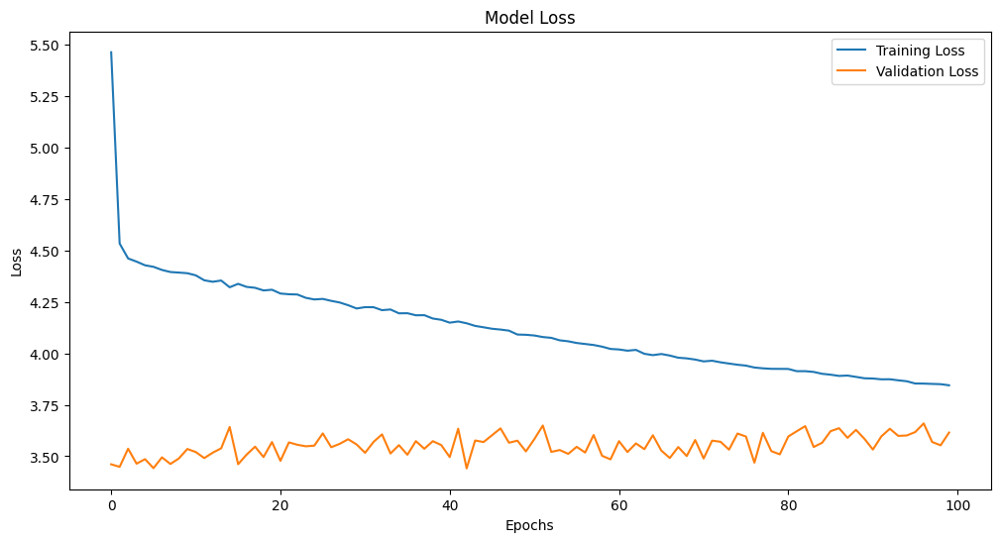

In [23]:
train_model()

In [24]:
model = load_model('mode_it001.h5')
data_frame_test


,assignment_id,problem_id,username,is_final,status,pre_score,coefficient,language_id,ACCEPT,WRONG,Time Limit Exceeded,Runtime Error,Memory Limit Exceeded,Killed,Syntax,diem
0,116,208,ed9eaeb6a707f50154024b24d7efcb874a9795dd,0,1,0,100,1,0,1,0,0,0,0,0,None
1,116,208,ed9eaeb6a707f50154024b24d7efcb874a9795dd,0,1,0,100,1,0,1,0,0,0,0,0,None
2,116,208,ed9eaeb6a707f50154024b24d7efcb874a9795dd,1,1,10000,100,1,1,0,0,0,0,0,0,None
3,116,335,ed9eaeb6a707f50154024b24d7efcb874a9795dd,1,1,10000,100,1,1,0,0,0,0,0,0,None
4,116,212,ed9eaeb6a707f50154024b24d7efcb874a9795dd,1,1,10000,100,1,1,0,0,0,0,0,0,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
294965,16,421,ea385e57f5d3d6841a6997dd7af680e135928bca,1,1,10000,100,1,1,0,0,0,0,0,0,None
294966,16,222,ea385e57f5d3d6841a6997dd7af680e135928bca,0,1,0,100,1,0,1,1,0,0,0,0,None
294967,16,222,ea385e57f5d3d6841a6997dd7af680e135928bca,0,1,0,100,1,0,1,0,0,0,0,0,None
294968,16,431,ea385e57f5d3d6841a6997dd7af680e135928bca,1,1,0,100,1,0,1,0,0,0,0,0,None


In [25]:
# Chọn cột 'username' từ DataFrame 'data_frame_test' và chuyển thành DataFrame riêng
username_column = data_frame_test["username"].to_frame()

# Tạo một cột mới có giá trị mặc định là 0
username_column["score"] = 0
predict_array = np.array(username_column)
username_column

,username,score
0,ed9eaeb6a707f50154024b24d7efcb874a9795dd,0
1,ed9eaeb6a707f50154024b24d7efcb874a9795dd,0
2,ed9eaeb6a707f50154024b24d7efcb874a9795dd,0
3,ed9eaeb6a707f50154024b24d7efcb874a9795dd,0
4,ed9eaeb6a707f50154024b24d7efcb874a9795dd,0
...,...,...
294965,ea385e57f5d3d6841a6997dd7af680e135928bca,0
294966,ea385e57f5d3d6841a6997dd7af680e135928bca,0
294967,ea385e57f5d3d6841a6997dd7af680e135928bca,0
294968,ea385e57f5d3d6841a6997dd7af680e135928bca,0


In [26]:
# Dự đoán
pred = model.predict(X_test)


4320/4320 ━━━━━━━━━━━━━━━━━━━━ 4s 938us/step


In [27]:
print(predict_array.shape)
# Lặp qua các dự đoán và làm tròn đến 5 số sau dấu thập phân
for i in range(len(predict_array)):
    predict_array[i][1] = np.round(pred[i], 5)

# In ra DataFrame sau khi làm tròn
print(predict_array)



(138225, 2)
[['ed9eaeb6a707f50154024b24d7efcb874a9795dd'
  array([3.76843], dtype=float32)]
 ['ed9eaeb6a707f50154024b24d7efcb874a9795dd'
  array([3.76843], dtype=float32)]
 ['ed9eaeb6a707f50154024b24d7efcb874a9795dd'
  array([5.0053], dtype=float32)]
 ...
 ['ea385e57f5d3d6841a6997dd7af680e135928bca'
  array([4.67732], dtype=float32)]
 ['ea385e57f5d3d6841a6997dd7af680e135928bca'
  array([3.52552], dtype=float32)]
 ['ea385e57f5d3d6841a6997dd7af680e135928bca'
  array([4.48635], dtype=float32)]]


In [28]:
user_scores = {}
for row in predict_array:
    user_id, score = row[0], row[1]
    if user_id in user_scores:
        user_scores[user_id][0] += score
        user_scores[user_id][1] += 1
    else:
        user_scores[user_id] = [score, 1]

# Tính trung bình điểm của mỗi người dùng và in ra
for user_id, (total_score, num_tests) in user_scores.items():
    average_score = total_score / num_tests
    print(f"User {user_id}: Average Score = {average_score}")

User ed9eaeb6a707f50154024b24d7efcb874a9795dd: Average Score = [5.3574185]
User ba12c0a2cb367af0467e479c03507c71a805d291: Average Score = [5.62984]
User b7298b0fe50443a623af9b56792b330c2d052845: Average Score = [5.7960587]
User c60be70309789b39355dc612f36e37090ccad5dc: Average Score = [5.4742646]
User a22a58c5be8aa2c2700619e37f2b7a6e4efa7e6b: Average Score = [5.5459213]
User d5841f944022e9ef49bf6ac9b5546dd82ab2784f: Average Score = [5.5470862]
User eb451c65ea210bed6af798282c2c6205c79f71fd: Average Score = [5.9675035]
User c3e73d0362e2b21fae6edfcf518063e8a28b7b63: Average Score = [5.948165]
User df9e2c6cfb6035fa5b26af3b101bacf64e95e913: Average Score = [4.989979]
User 99103791231143dd15aa77f2aeb87b2cd4a1c22e: Average Score = [5.778132]
User e2ed5ffddf1e60198f9f138810f84b7107ca0561: Average Score = [5.371978]
User 8554d1155712da4bc72ec5921db3227311265359: Average Score = [5.631446]
User 89fe8b96c04597a0fb63dca3a86e5f36e7580940: Average Score = [7.0870895]
User 8b65dcf807a9de0c95c0896919d

In [29]:
# Create an empty DataFrame
data_output = pd.DataFrame(columns=['User', 'Average Score'])

# Iterate through user_scores and add rows to the DataFrame
for user_id, (total_score, num_tests) in user_scores.items():
    average_score = (float) (total_score / num_tests)
    
    new_row = {'User': user_id, 'Average Score': average_score}
    data_output = pd.concat([data_output, pd.DataFrame([new_row])], ignore_index=True)

data_output

# Lưu DataFrame thành tệp CSV
data_output.to_csv("predict_output.csv", header=False, index=False)


C:\Users\vuong\AppData\Local\Temp\ipykernel_6124\581810766.py:6: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  average_score = (float) (total_score / num_tests)
C:\Users\vuong\AppData\Local\Temp\ipykernel_6124\581810766.py:9: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  data_output = pd.concat([data_output, pd.DataFrame([new_row])], ignore_index=True)
